# Homework 2 Learning, Inference, Decisions
### Nikhil Pereira nmp54
### March 7th, 2022



In [2]:
import pandas as pd
import scipy.stats
import statsmodels.stats.api as sms
import numpy as np
import scipy as sp
import scipy.stats
import warnings
import matplotlib.pyplot
warnings.filterwarnings('ignore')

## Problem 1

### 1a
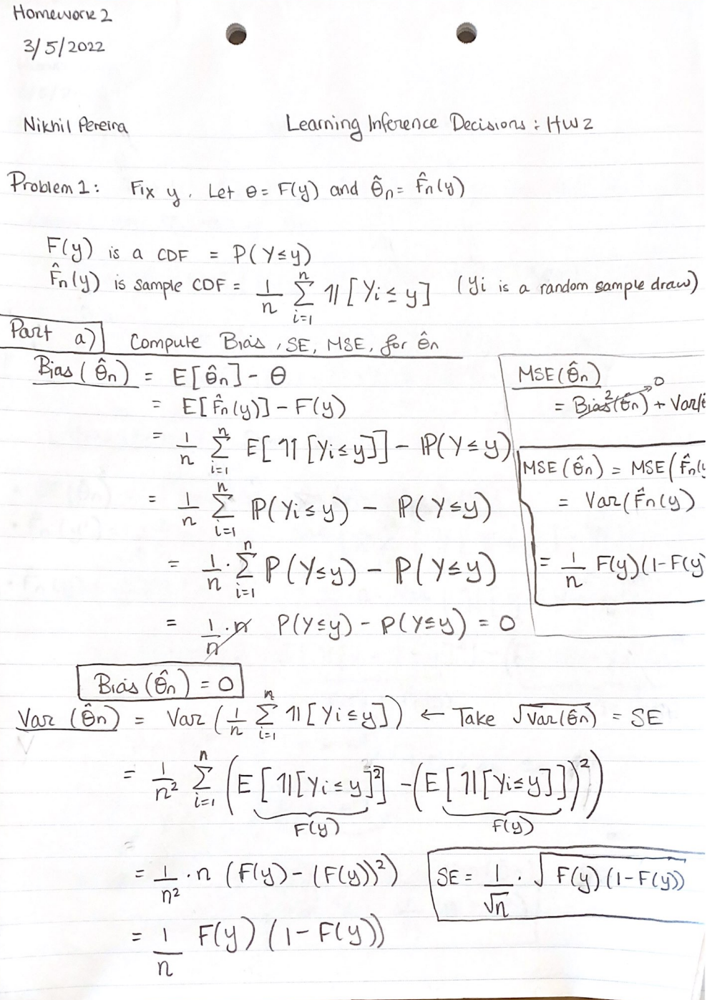

### 1b
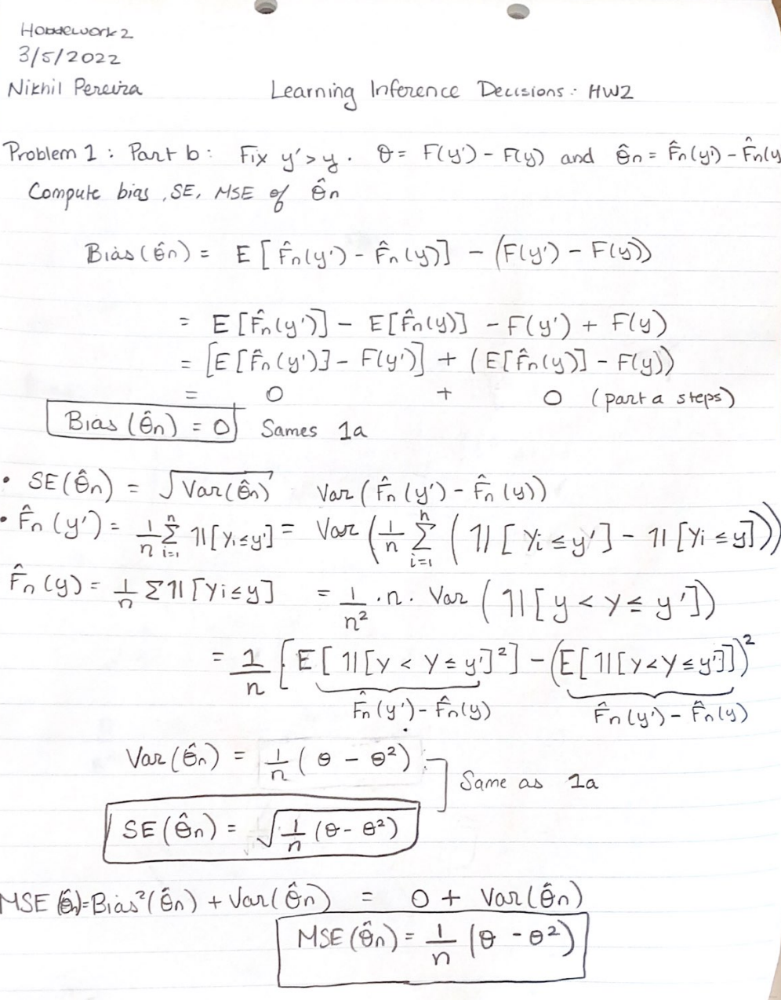

## Problem 2

### 2a
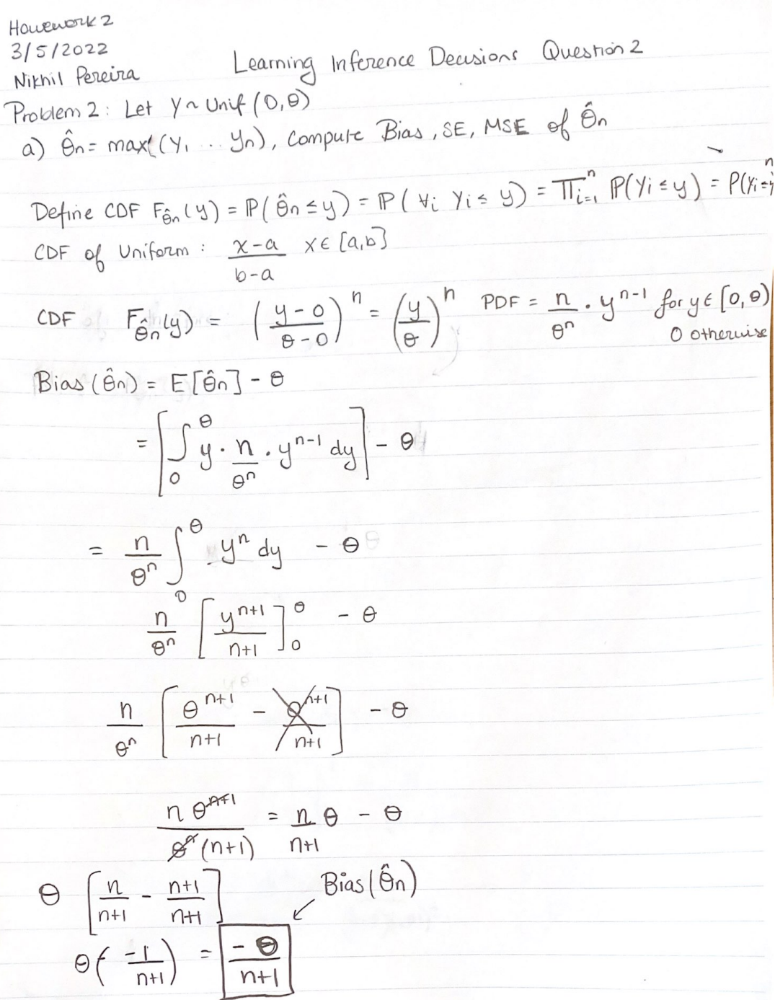

### 2a Standard Error and MSE
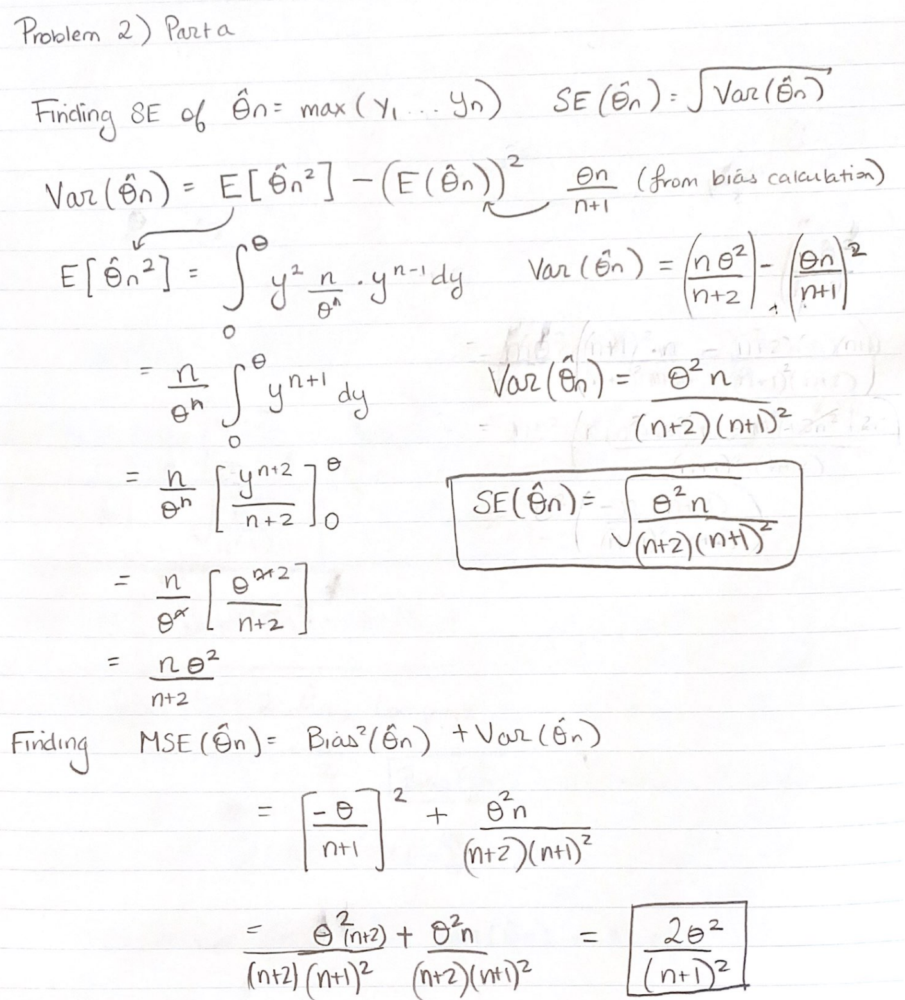

### 2b and 2c
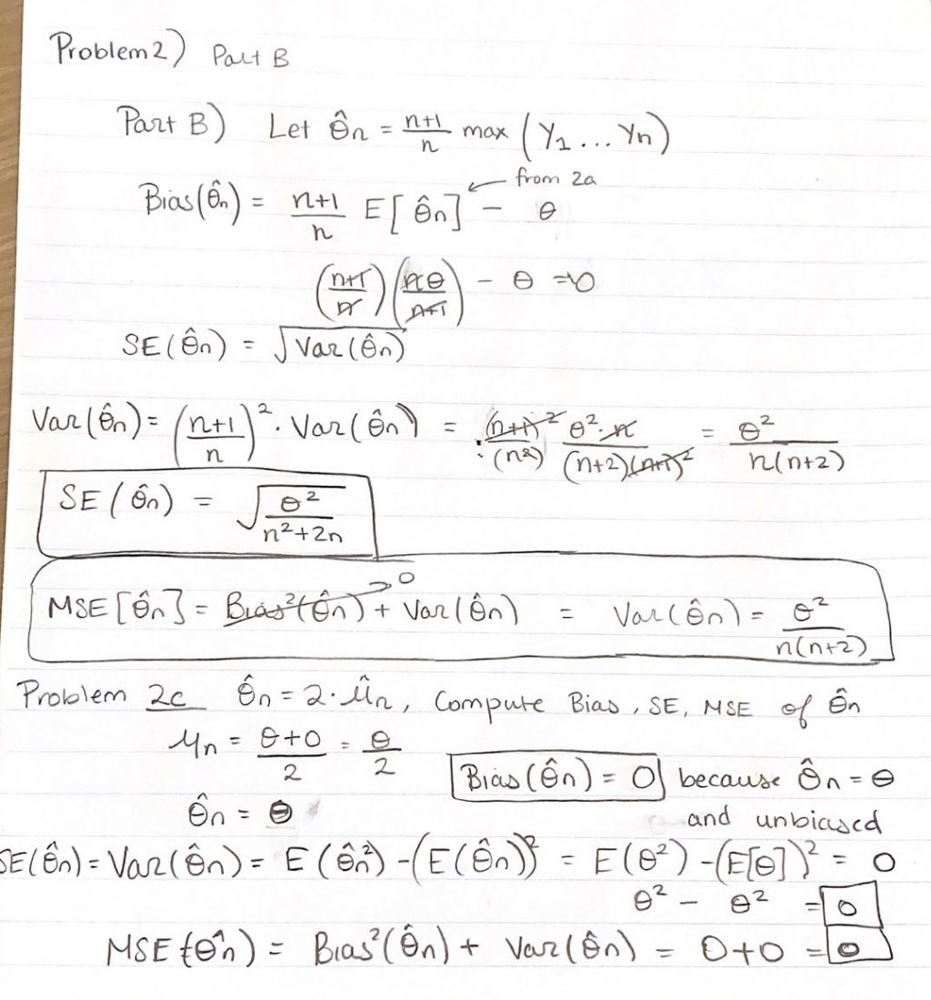


### 2d Compare and Contrast estimators
An unbiased estimator is an accurate statistic to approximate a population parameter. Theta_hat_n from part A has a negative bias which means it underestimates the population parameter whereas theta_hat_n from part B and C have no bias. Note that the MSE of the estimator in part A is roughly 2x the MSE of the estimator in part B although they have similar variances. If the goal is to minimize MSE the estimator for part B would be a better choice. You would want to use the theta_hat_n from part c when you want the estimator to be the average of uniform RVs and unbiased and have zero variance. 

## Problem 3

### Approximating Binomial as Normal when N is sufficiently large
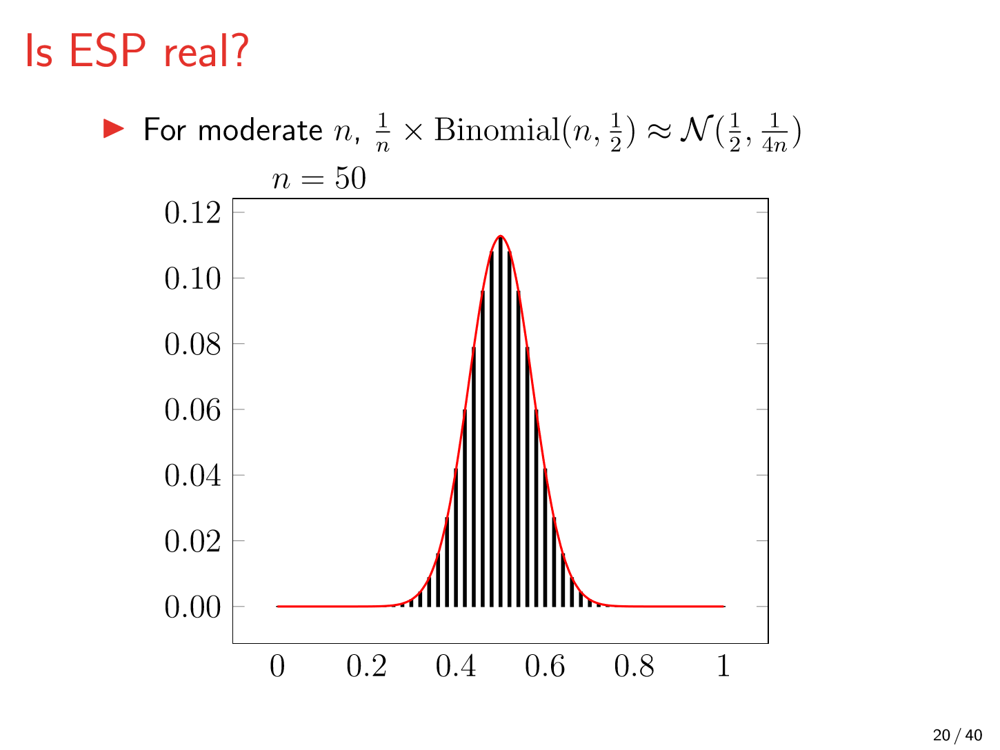

### Problem 3 Explanation
Since we are showing that the normal distribution can approximate the binomial distribution when the number of samples is sufficiently large we can use stats models two-sided Z test to test the null hypothesis that the probability of death before or after a certain holiday is 0.5. The null hypothesis says that the liklihood of passing a way is 0.5 before or after like an unbiased coin. The P-value observed for this sample is 0.086 which is > 0.05 alpha value therefore we fail to reject the null hypothesis and and do have sufficient evidence for the theory that people can postpone their death until after an important event.

In [3]:
n = 1919
thetahat = 997/n
pval = 2.*(1.-sp.stats.norm.cdf(np.abs(thetahat-1./2)*2.*np.sqrt(n)))
print('pval =',pval)
print('Reject H_0?',np.abs(thetahat-0.5)>=1.96/2/np.sqrt(n))

pval = 0.08688212846769039
Reject H_0? False


## Problem 4

### 4a Explanation


Since F0 is monotone decreasing the F-Hat can take on three cases either greater than F0 (Picture 1), less than F0 (Picture 2) or both above and below F0 (Picture 3). Since the Yi's are ordered statistics we get the step function F-hat on the graphs. This shows that the maximum difference can be found by function Dn in case 1 where the the maximum difference occurs at the right tail F0(Yi) - (i-1)/n, case 2 when its found at the left tail (i/n) - F0(Yi), and case 3 when it can be found as the max of {F0(Yi) - (i-1)/n, (i/n) - F0(Yi)} This is the formula given in the problem statement Dn. 

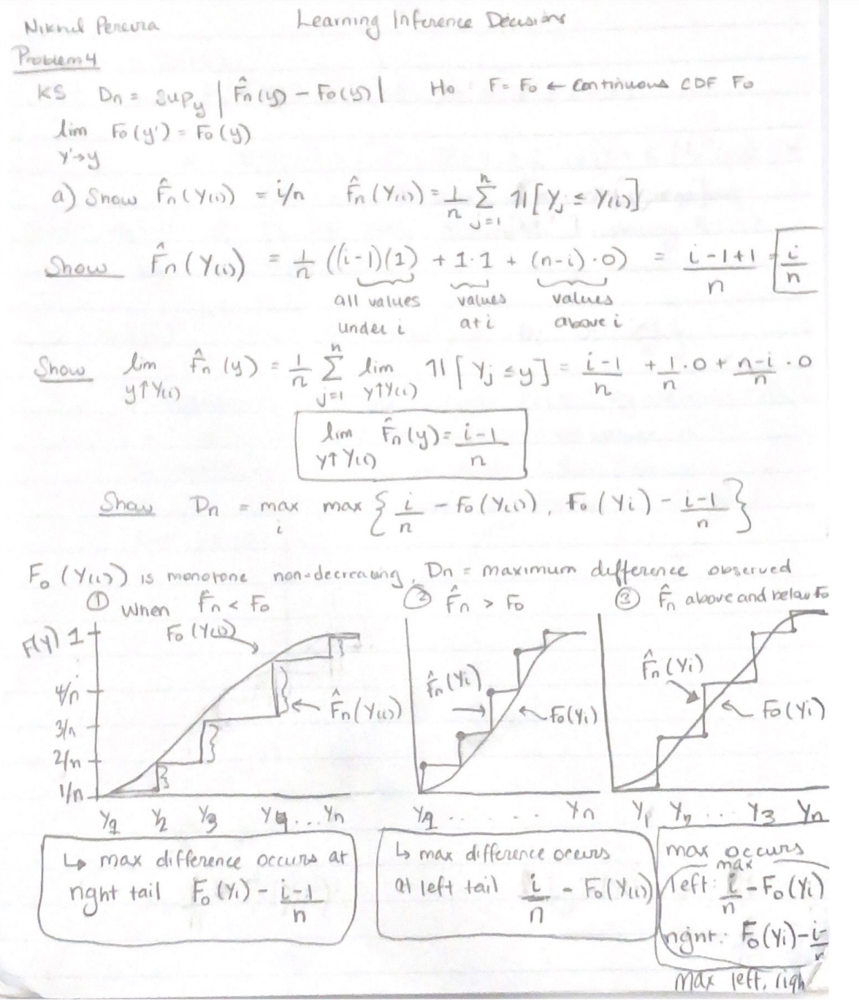




### 4b

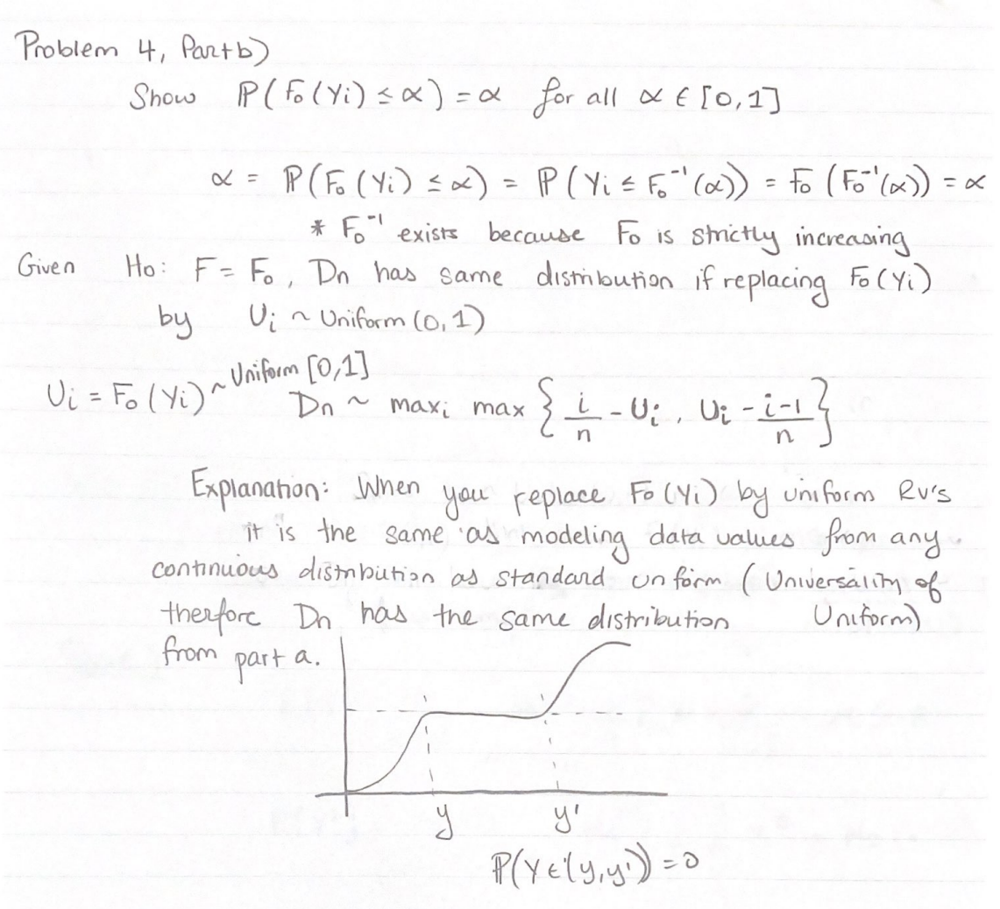

### 4c

The 95% quantile of the D20's 10,000 draws is 0.290939. The code below simulates this result. 

Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib
95th percentile of maxes 0.29039710359820947


(array([ 343., 2234., 2821., 2264., 1340.,  632.,  251.,   79.,   30.,
           6.]),
 array([0.06512573, 0.10454837, 0.143971  , 0.18339363, 0.22281626,
        0.26223889, 0.30166153, 0.34108416, 0.38050679, 0.41992942,
        0.45935205]),
 <BarContainer object of 10 artists>)

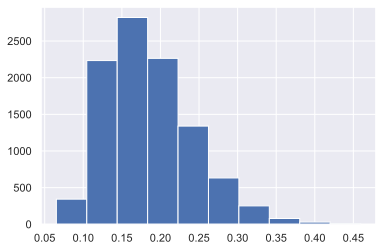

In [3]:
%pylab
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import seaborn as sns
sns.set()
np.random.seed(0)
a=np.random.uniform(0,1,size=(10000,20))
s = np.sort(a, axis=1).tolist()
maxKS_list = [0] * 10000
for i,x in enumerate(s):
    for ix,val in enumerate(s[i]): #for each row apply the formula
        currentMax = max(((ix+1)/20)-val,val - ((ix)/20))
        if currentMax > maxKS_list[i]:
            maxKS_list[i] = currentMax
print('95th percentile of maxes', np.percentile(np.array(maxKS_list), 95))
hist(maxKS_list)

### 4d

Using Scipy's KStest we observe that the p-value rom this sample is 0.7237 which is greater than 0.05. Therefore we fail to reject the null hypothesis that Y follows a standard normal dsitribution. We have sufficient evidence that from this sample that Y is standard normal.  We do not have sufficient evidence that the sampled data does not come from the normal distribution. 

In [4]:
sample = [0.23, 0.72, -0.60, -0.68, 0.77, 0.24, -0.53, 0.26, -0.33,-0.76, 0.16, -0.92, 0.54, 1.6, -1.1, 0.065, -0.091, 2.3, 0.18, -0.19]
from scipy import stats
stats.kstest(sample,'norm')

KstestResult(statistic=0.1474318867982395, pvalue=0.7237036178817857)

## Problem 5

### 5a

In [4]:
url = 'https://raw.githubusercontent.com/genomicsclass/dagdata/master/inst/extdata/babies.txt'
%pylab
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import seaborn as sns
sns.set()
babies = pd.read_table(url,sep='\s+')
bwt_nonsmoke = babies[babies.smoke==0]
bwt_smoke = babies[babies.smoke==1]

Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib


In [5]:
#Generating a random sample of size 10 from both non smoke and smoke 
s1 = bwt_nonsmoke.sample(n=10,random_state=0)
s2 = bwt_smoke.sample(n=10, random_state=0)
nonSmokeMean = s1.bwt.mean()
smokeMean = s2.bwt.mean()
#Comparing thier means
print('Difference in Mean Non Smoke - Smoke', nonSmokeMean - smokeMean)

Difference in Mean Non Smoke - Smoke 10.699999999999989


### 5b

In [6]:
y = np.array(pd.concat([s1.bwt,s2.bwt], axis=0)) #Concatenate the two samples
t = np.array(pd.concat([s1.smoke,s2.smoke], axis=0)).astype('bool') #Keep a true false array of length 20
#Shuffle the data
np.random.shuffle(t)
#Calculate the delta
delta = y.dot(t)/t.sum() - y.dot(~t)/(~t).sum()
print('Difference in Mean Non Smoke - Smoke with Permutation; ', delta)

Difference in Mean Non Smoke - Smoke with Permutation;  2.5


### 5c

In [7]:
#Repeat experiment 1000 times for the difference in means
B = 1000
permutations = np.zeros(B)
for i in range(B):
    np.random.shuffle(t)
    permutations[i] = y.dot(t)/t.sum() - y.dot(~t)/(~t).sum()

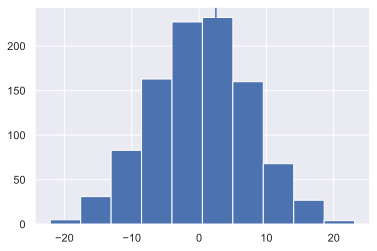

In [8]:
hist(permutations)
axvline(x=delta)

In [9]:
print('permutation pval for sample mean difference =',(1.+(np.abs(permutations)>=np.abs(delta)).sum())/(B+1.))

permutation pval for sample mean difference = 0.7512487512487512


### 5d

permutation pval for difference in medians = 1.0


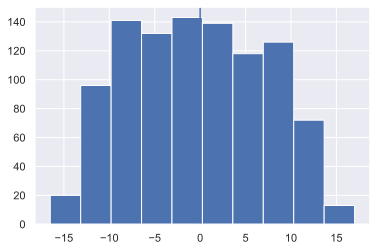

In [10]:
thetahat_fn = lambda y,t: np.median(y[t==1])-np.median(y[t==0])
thetahat = thetahat_fn(y,t)
B = 1000
permutations = np.zeros(B)
for i in range(B):
    np.random.shuffle(t)
    permutations[i] = thetahat_fn(y,t)
hist(permutations)
axvline(x=thetahat)
print('permutation pval for difference in medians =',(1.+(np.abs(permutations)>=np.abs(thetahat)).sum())/(B+1.))

### 5e

permutation pval for different in KS = 0.7572427572427572


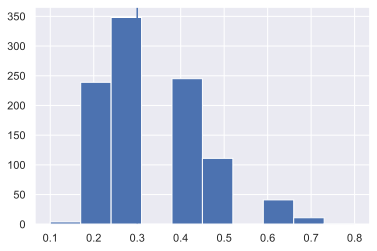

In [11]:
thetahat_fn = lambda y,t: sp.stats.ks_2samp(y[t==1],y[t==0])[0]
thetahat = thetahat_fn(y,t)
B = 1000
permutations = np.zeros(B)
for i in range(B):
    np.random.shuffle(t)
    permutations[i] = thetahat_fn(y,t)
hist(permutations)
axvline(x=thetahat)
print('permutation pval for different in KS =',(1.+(np.abs(permutations)>=np.abs(thetahat)).sum())/(B+1.))

### 5f

In this code below I am simulating the permutation test for difference in mean, median and ks 1000 times and counting the times the P-vals are below 0.05 for each. From the experiment I obtained 183 for mean, 171 for median and 123 for KS that were below 0.05. 

In [27]:
#Generate random samples
mean_count = 0
median_count = 0
ks_count = 0
for trial in range(1000):
    rs = np.random.randint(1000) 
    s1 = bwt_nonsmoke.sample(n=10,random_state=rs)
    s2= bwt_smoke.sample(n=10, random_state=rs)
    y = np.array(pd.concat([s1.bwt,s2.bwt], axis=0))
    t = np.array(pd.concat([s1.smoke,s2.smoke], axis=0)).astype('bool')

    B = 1000
    thetahat_fn_mean = lambda y,t: np.mean(y[t==1])-np.mean(y[t==0])
    thetahat_fn_median = lambda y,t: np.median(y[t==1])-np.median(y[t==0])
    thetahat_fn_ks = lambda y,t: sp.stats.ks_2samp(y[t==1],y[t==0])[0]

    thetahat_mean = thetahat_fn_mean(y,t)
    thetahat_med = thetahat_fn_median(y,t)
    thetahat_ks = thetahat_fn_ks(y,t)

    permutations_mean = np.zeros(B)
    permutations_med = np.zeros(B)
    permutations_ks = np.zeros(B)

    for i in range(B):
        np.random.shuffle(t)
        permutations_mean[i] = thetahat_fn_mean(y,t)
        permutations_med[i] = thetahat_fn_median(y,t)
        permutations_ks[i] = thetahat_fn_ks(y,t)

    p_val_mean = (1.+(np.abs(permutations_mean)>=np.abs(thetahat_mean)).sum())/(B+1.)
    p_val_med = (1.+(np.abs(permutations_med)>=np.abs(thetahat_med)).sum())/(B+1.)
    p_val_ks = (1.+(np.abs(permutations_ks)>=np.abs(thetahat_ks)).sum())/(B+1.)
    if p_val_mean < 0.05:
        mean_count+=1
    if p_val_med < 0.05:
        median_count+=1
    if p_val_ks < 0.05:
        ks_count+=1
print("Number of times P-Value is significant for each statistic:", mean_count, median_count, ks_count)

Number of times P-Value is significant for each statistic: 183 171 123


### Problem 6

### 6a

In [12]:
twain = np.array([0.225,0.262,0.217,0.240,0.230,0.229,0.235,0.217])
snod = np.array([0.209, 0.205, 0.196, 0.210, 0.202, 0.207, 0.224,0.223, 0.220, 0.201])

In [13]:
n1 = len(twain)
n0 = len(snod)
sd1 = twain.std()
sd0 = snod.std()
sd = np.sqrt(((n1-1)*sd1**2 + (n0-1)*sd0**2)/(n0+n1-2))
mu1 = twain.mean()
mu0 = snod.mean()
delta = mu1-mu0 
tn = delta/(sd * np.sqrt(1./n0+1./n1))
print('t_n =',tn)

t_n = 4.124666817301824


Since the p-value is < 0.05 we reject Ho. We have sufficient evidence that the mean difference between proportion of three letter words in twains essays are different than the proportion of three letter words in Snodgrass's essays. With the CI we are 95% certain that the difference in proportion of three letters (Twain - Snodgrass) lies in the interval [0.010778, 0.033572]

In [14]:
print('p-val for H_0 =',2*(1-scipy.stats.t.cdf(abs(tn),n1+n0-2)))
Q = sp.stats.t.ppf(1-.05/2,n1+n0-2)
print('95pct CI for avg diff = [%f,%f]'%(delta - Q*(sd * np.sqrt(1./n0+1./n1)),delta + Q*(sd * np.sqrt(1./n0+1./n1))))

p-val for H_0 = 0.0007943944664181579
95pct CI for avg diff = [0.010778,0.033572]


### 6b

In [15]:
y = np.concatenate((twain, snod), axis=0)
t = np.array([1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0]).astype('bool')

Since the permutation p_value is very small we can reject the null hypothesis that the proportion of three letter words for both Twain and Snodgrass are the same. Our distribution shows that this scenario is very unlikely and confirms are original conclusion for the student t-test.

permutation pval = 0.0006999300069993001


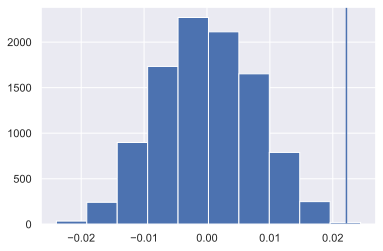

In [16]:
thetahat_fn = lambda y,t: np.mean(y[t==1])-np.mean(y[t==0])
thetahat = thetahat_fn(y,t)
B = 10000
permutations = np.zeros(B)
for i in range(B):
    np.random.shuffle(t)
    permutations[i] = thetahat_fn(y,t)
hist(permutations)
axvline(x=thetahat)
print('permutation pval =',(1.+(np.abs(permutations)>=np.abs(thetahat)).sum())/(B+1.))

## Problem 7
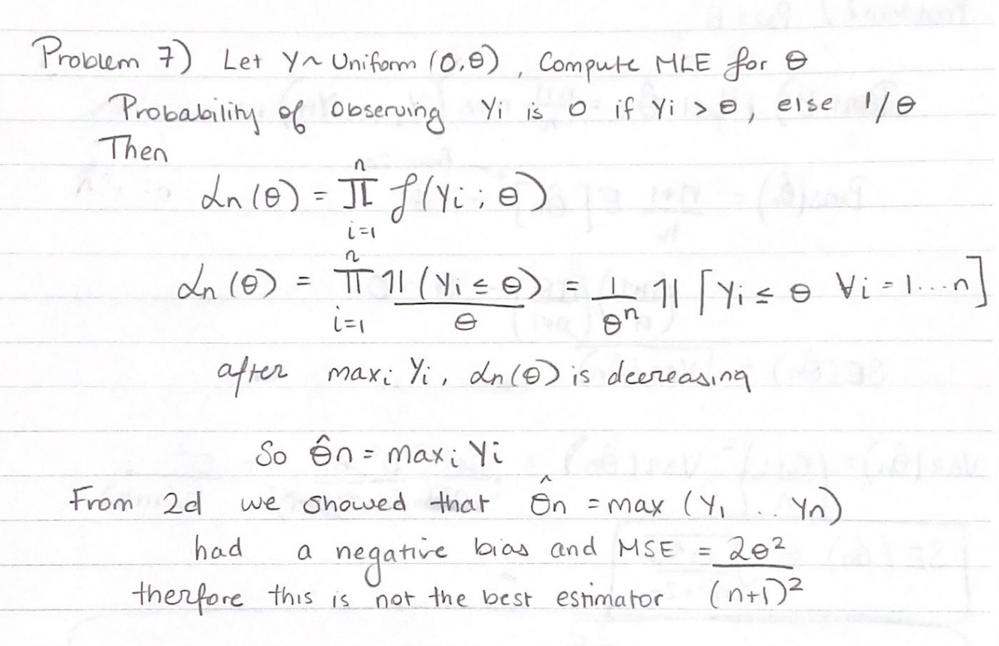

## Problem 8

### 8a , 8b

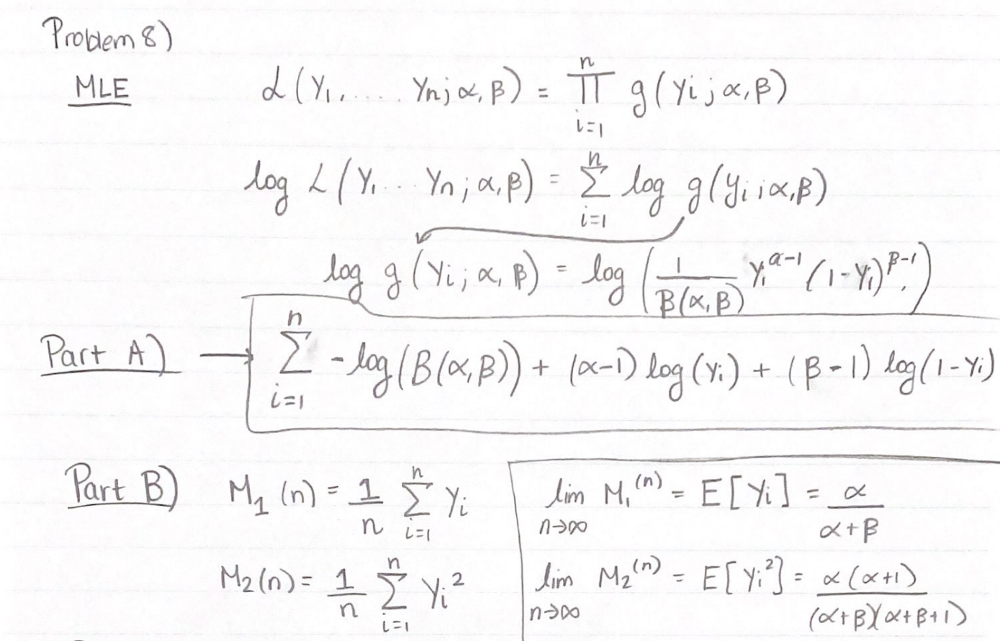

### 8c Proving M1

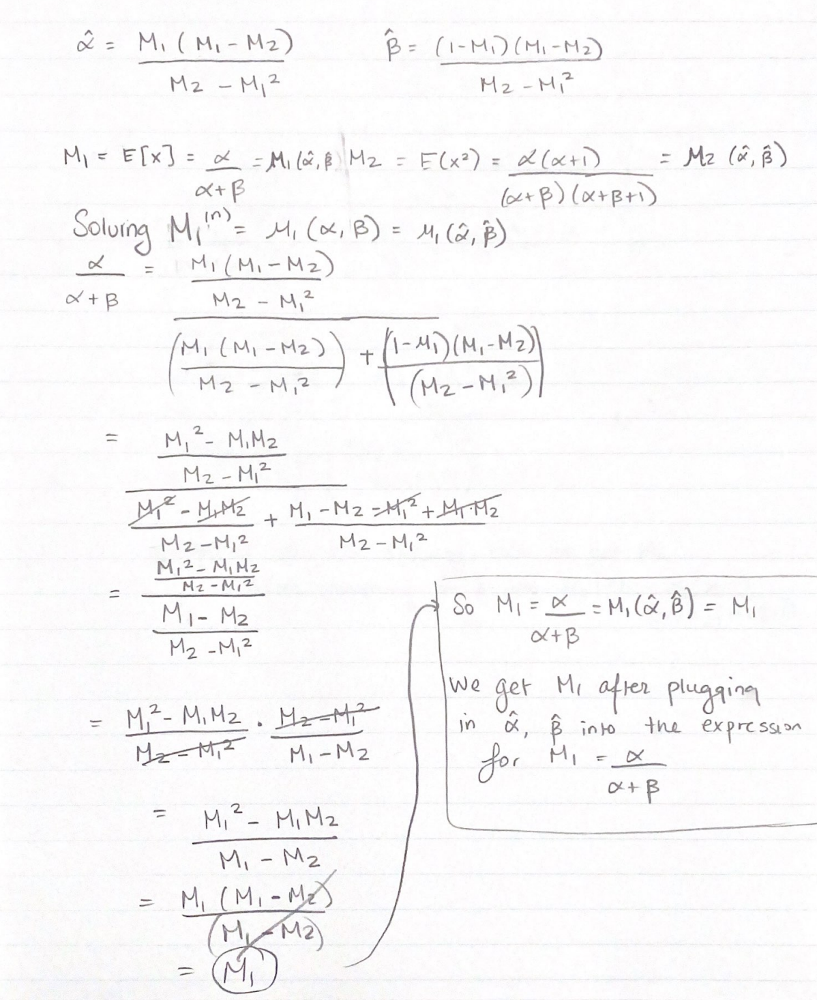

### Proving M2
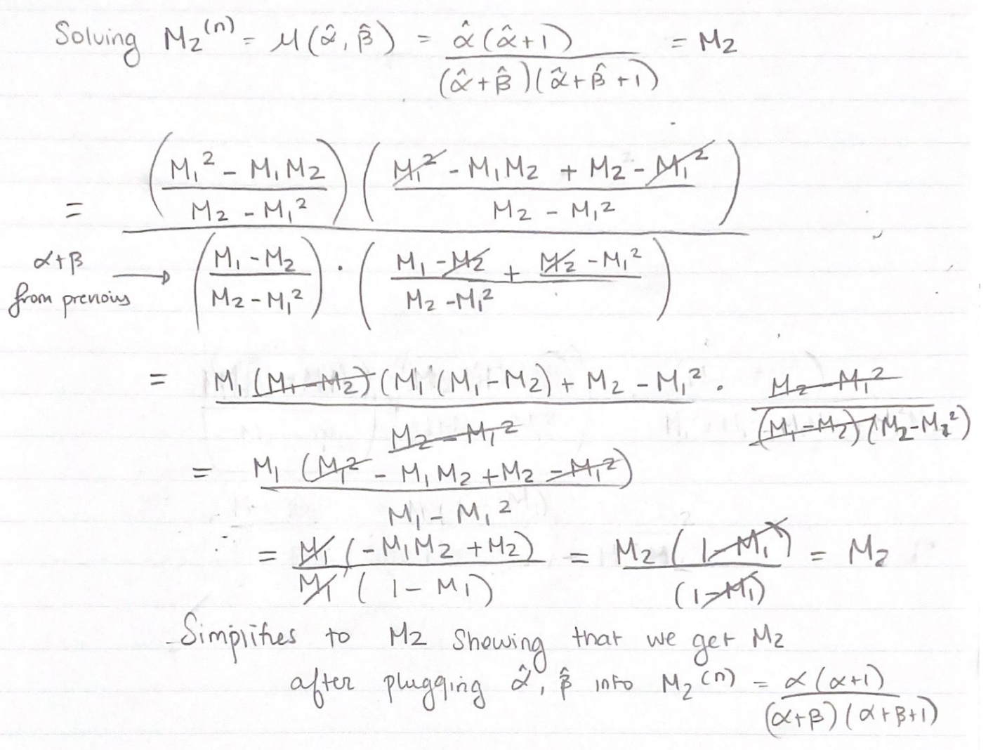

### 8d


As n increases the difference between the estimators alpha_hat and beta_hat and the true estimator alpha ane beta gets smaller and smaller. This indicates that the method of moments is useful approach to estimation when MLE is intractable. 

In [31]:
import numpy as np
def calculateMoments(arr):
    M1 = numpy.sum(arr)/len(arr)
    squared = numpy.square(arr)
    M2 = numpy.sum(squared)/len(arr)
    #calcualte alpha and beta and compare for multiple n
    alpha_hat = (M1*(M1-M2)) / (M2-M1**2)
    beta_hat = ((1-M1)*(M1-M2)) / (M2-M1**2)
    return alpha_hat-1, beta_hat-1

In [28]:
#Generate beta distribution points
arr100= np.random.beta(1,1,100)
arr1000= np.random.beta(1,1,1000)
arr10000= np.random.beta(1,1,10000)

In [32]:
#Calculate estimators at different ns
a_100, b_100 = calculateMoments(arr100)
a_1000, b_1000 = calculateMoments(arr1000)
a_10000, b_10000 = calculateMoments(arr10000)
print('Difference of Alpha and Beta estimators when n = 100  ', a_100, b_100)
print('Difference of Alpha and Beta estimators when n = 1000  ', a_1000, b_1000)
print('Difference of Alpha and Beta estimators when n = 10000  ', a_10000, b_10000)

Difference of Alpha and Beta estimators when n = 100   -0.20014415206914304 0.012858900241198956
Difference of Alpha and Beta estimators when n = 1000   -0.00979690807490674 -0.010287177434149974
Difference of Alpha and Beta estimators when n = 10000   0.01866774181565134 0.010332101289682871
